In [1]:
#@title Install
!pip install -q ultralytics
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 51.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.3 MB/s eta 0:00:00


In [2]:
#@title Import
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [11]:
#@title Download Dataset
from roboflow import Roboflow
rf = Roboflow(api_key="API_KEY")
project = rf.workspace("eagle-eye").project("basketball-1zhpe")
version = project.version(1)
dataset = version.download("yolov8")
project_hoop = rf.workspace("jack-gg6yw").project("basketball_and_hoop2")
version_hoop = project_hoop.version(4)
dataset_hoop = version_hoop.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Basketball-1 in yolov8:: 100%|██████████| 5210/5210 [00:00<00:00, 8677.10it/s]


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to basketball_and_hoop2-4 in yolov8:: 100%|██████████| 3700/3700 [00:00<00:00, 6261.34it/s]


In [12]:
#@title Format Data
!rm -rf dataset

!mkdir dataset
!mkdir dataset/train
!mkdir dataset/test
!mkdir dataset/valid

!mkdir dataset/train/images
!mkdir dataset/valid/images
!mkdir dataset/test/images
!mkdir dataset/train/labels
!mkdir dataset/valid/labels
!mkdir dataset/test/labels

!cp ./Basketball-1/train/images/*.jpg ./dataset/train/images
!cp ./Basketball-1/valid/images/*.jpg ./dataset/valid/images
!cp ./Basketball-1/test/images/*.jpg ./dataset/test/images
!cp ./Basketball-1/train/labels/*.txt ./dataset/train/labels
!cp ./Basketball-1/valid/labels/*.txt ./dataset/valid/labels
!cp ./Basketball-1/test/labels/*.txt ./dataset/valid/labels
!cp ./basketball_and_hoop2-4/train/images/*.jpg ./dataset/train/images
!cp ./basketball_and_hoop2-4/valid/images/*.jpg ./dataset/valid/images
!cp ./basketball_and_hoop2-4/test/images/*.jpg ./dataset/test/images
!cp ./basketball_and_hoop2-4/train/labels/*.txt ./dataset/train/labels
!cp ./basketball_and_hoop2-4/valid/labels/*.txt ./dataset/valid/labels
!cp ./basketball_and_hoop2-4/test/labels/*.txt ./dataset/test/labels

!ls dataset/train/labels | wc -l
!ls dataset/valid/labels | wc -l
!ls dataset/test/labels | wc -l

3288
971
184


In [13]:
#@title Consolidate Dataset
!rm -rf datasets
!mkdir datasets
!cp -r ./dataset datasets

In [14]:
#@title Data Setup for Ultralytics
data_yaml = '''
names:
- ball
- hoop
- na
nc: 3
test: ./dataset/test/images
train: ./dataset/train/images
val: ./dataset/valid/images
'''
with open('data.yaml', 'w') as file:
    file.write(data_yaml)

In [17]:
#@title Model Construction
model = YOLO("yolov8m")

In [18]:
#@title Training
results = model.train(data="data.yaml", epochs=30, imgsz=640, name = 'bigimg')

Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=bigimg, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wid

train: Scanning /content/datasets/dataset/train/labels.cache... 3288 images, 38 backgrounds, 0 corrupt: 100%|██████████| 3288/3288 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/dataset/valid/labels.cache... 499 images, 7 backgrounds, 0 corrupt: 100%|██████████| 499/499 [00:00<?, ?it/s]


Plotting labels to runs/detect/bigimg/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/bigimg
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      8.28G      1.186      1.656      1.277         15        640: 100%|██████████| 206/206 [01:05<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]


                   all        499        761       0.35      0.498      0.339       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      8.38G      1.308       1.35       1.39         32        640: 100%|██████████| 206/206 [01:03<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]


                   all        499        761      0.793      0.658      0.765       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.36G      1.305      1.327      1.385         18        640: 100%|██████████| 206/206 [01:02<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]


                   all        499        761      0.809      0.631      0.741      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      8.37G      1.263      1.209      1.355         23        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]


                   all        499        761      0.862      0.795      0.842      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      8.35G      1.205      1.113      1.315         16        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.53it/s]


                   all        499        761      0.737      0.808      0.769      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.35G       1.17      1.027       1.29         18        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]

                   all        499        761      0.846      0.857      0.895      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      8.35G      1.136     0.9706      1.264         13        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]

                   all        499        761      0.876      0.846      0.901       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.36G      1.109     0.9226      1.247         13        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]

                   all        499        761      0.911      0.831      0.912      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      8.34G      1.083     0.8953      1.224         22        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]

                   all        499        761      0.897      0.824      0.904      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      8.37G       1.05     0.8383      1.208         19        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]

                   all        499        761      0.911      0.845        0.9      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      8.34G      1.018     0.7865      1.197         20        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

                   all        499        761      0.904      0.837      0.912      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      8.36G      1.011     0.7709      1.181         17        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761       0.89      0.868      0.932      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      8.34G      0.999     0.7725      1.183         24        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]

                   all        499        761      0.934       0.86      0.926      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.38G     0.9818     0.7512      1.177         10        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

                   all        499        761        0.9      0.876      0.929      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      8.35G     0.9536     0.6949      1.156         26        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]

                   all        499        761      0.915      0.859      0.922      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.36G      0.969     0.6945      1.163         17        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.918      0.875      0.929      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.37G     0.9557     0.6879      1.156         21        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]

                   all        499        761      0.945      0.855      0.939      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.35G     0.9279     0.6555       1.14         19        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

                   all        499        761      0.931       0.87      0.942      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      8.34G     0.9173     0.6539      1.141         22        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.912      0.889      0.938      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      8.35G     0.9175     0.6326      1.131         13        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]

                   all        499        761      0.941      0.879      0.939       0.69


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.32G     0.9227     0.5723      1.116          7        640: 100%|██████████| 206/206 [01:02<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.941       0.89      0.948      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.36G     0.8986     0.5678      1.112         10        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.928       0.89      0.943      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      8.35G     0.8965     0.5433      1.104         12        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.943      0.893      0.952      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.35G     0.8733     0.5254      1.092          9        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]

                   all        499        761      0.923        0.9      0.948      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.33G     0.8562     0.4962      1.081          8        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

                   all        499        761      0.924      0.906       0.95      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.36G     0.8442     0.4836      1.075          6        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.947      0.902      0.951      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      8.35G     0.8378     0.4694      1.062          7        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]

                   all        499        761       0.94      0.902      0.956       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.35G     0.8184     0.4552      1.055          9        640: 100%|██████████| 206/206 [01:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.923      0.919      0.956      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.34G     0.8039     0.4277       1.05          8        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]

                   all        499        761      0.926      0.915      0.955      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.36G     0.7952     0.4312      1.039          8        640: 100%|██████████| 206/206 [01:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]

                   all        499        761      0.932      0.913      0.957      0.735



30 epochs completed in 0.572 hours.
Optimizer stripped from runs/detect/bigimg/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/bigimg/weights/best.pt, 52.0MB

Validating runs/detect/bigimg/weights/best.pt...
Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:04<00:00,  3.41it/s]


                   all        499        761      0.932      0.914      0.957      0.734
                  ball        392        464      0.894      0.891      0.941      0.737
                  hoop        222        297      0.969      0.936      0.972      0.732
Speed: 0.2ms preprocess, 5.4ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/bigimg


In [20]:
#@title Tensorboard
%load_ext tensorboard
%tensorboard --logdir runs/detect/bigimg

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12747), started 0:00:16 ago. (Use '!kill 12747' to kill it.)

<IPython.core.display.Javascript object>

In [21]:
#@title Export
model.export(format="tflite")

Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 218 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs

PyTorch: starting from 'runs/detect/bigimg/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (49.6 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'onnx>=1.12.0', 'onnx2tf>1.17.5,<=1.22.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 232.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 183.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 308.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.7/142.7 kB 308.9 MB/s eta

100%|██████████| 1.11M/1.11M [00:00<00:00, 123MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 46.60file/s]


ONNX: starting export with onnx 1.17.0 opset 19...


ONNX: slimming with onnxslim 0.1.42...
ONNX: export success ✅ 3.3s, saved as 'runs/detect/bigimg/weights/best.onnx' (98.9 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 58.0s, saved as 'runs/detect/bigimg/weights/best_saved_model' (247.3 MB)

TensorFlow Lite: starting export with tensorflow 2.17.1...
TensorFlow Lite: export success ✅ 0.0s, saved as 'runs/detect/bigimg/weights/best_saved_model/best_float32.tflite' (98.8 MB)

Export complete (60.4s)
Results saved to /content/runs/detect/bigimg/weights
Predict:         yolo predict task=detect model=runs/detect/bigimg/weights/best_saved_model/best_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=runs/detect/bigimg/weights/best_saved_model/best_float32.tflite imgsz=640 data=data.yaml  
Visualize:       https://netron.app


'runs/detect/bigimg/weights/best_saved_model/best_float32.tflite'

In [ ]:
#@title Inference on Images
import os
pred_results = []
filenames = os.listdir('dataset/test/images')
filenames = [os.path.join('dataset/test/images', filename) for filename in filenames]
for i, filename in enumerate(range(len(filenames) // 64)):
  pred_results.append(model(filenames[i * 64:(i + 1) * 64], task = 'detect'))


0: 224x224 1 ball, 1.1ms
1: 224x224 1 ball, 1.1ms
2: 224x224 1 ball, 1.1ms
3: 224x224 1 hoop, 1.1ms
4: 224x224 1 ball, 1.1ms
5: 224x224 1 ball, 2 hoops, 1.1ms
6: 224x224 1 ball, 1.1ms
7: 224x224 2 balls, 1.1ms
8: 224x224 1 ball, 1.1ms
9: 224x224 1 ball, 1.1ms
10: 224x224 1 ball, 1.1ms
11: 224x224 1 ball, 1.1ms
12: 224x224 1 ball, 1.1ms
13: 224x224 1 ball, 1.1ms
14: 224x224 1 ball, 1.1ms
15: 224x224 1 ball, 1.1ms
16: 224x224 1 ball, 1.1ms
17: 224x224 1 ball, 1.1ms
18: 224x224 1 ball, 1.1ms
19: 224x224 1 ball, 1.1ms
20: 224x224 3 balls, 1.1ms
21: 224x224 3 balls, 1.1ms
22: 224x224 1 ball, 1.1ms
23: 224x224 1 ball, 1.1ms
24: 224x224 1 ball, 1.1ms
25: 224x224 1 ball, 1.1ms
26: 224x224 1 ball, 1.1ms
27: 224x224 1 ball, 1 hoop, 1.1ms
28: 224x224 1 ball, 1.1ms
29: 224x224 1 ball, 1 hoop, 1.1ms
30: 224x224 1 ball, 1.1ms
31: 224x224 2 hoops, 1.1ms
32: 224x224 1 hoop, 1.1ms
33: 224x224 1 hoop, 1.1ms
34: 224x224 6 balls, 1.1ms
35: 224x224 2 balls, 1.1ms
36: 224x224 1 ball, 1.1ms
37: 224x224 1 ba

In [ ]:
#@title Check Example Inference
print(pred_results[5][0].boxes)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.8687], device='cuda:0')
data: tensor([[226.8828, 261.1122, 302.0241, 323.5108,   0.8687,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (416, 416)
shape: torch.Size([1, 6])
xywh: tensor([[264.4534, 292.3115,  75.1413,  62.3986]], device='cuda:0')
xywhn: tensor([[0.6357, 0.7027, 0.1806, 0.1500]], device='cuda:0')
xyxy: tensor([[226.8828, 261.1122, 302.0241, 323.5108]], device='cuda:0')
xyxyn: tensor([[0.5454, 0.6277, 0.7260, 0.7777]], device='cuda:0')


In [23]:
#@title Infer on Video
import cv2
import numpy as np
import tensorflow as tf

interpreter = tf.lite.Interpreter(model_path="runs/best_float32.tflite")
interpreter.allocate_tensors()

video = cv2.VideoCapture('basketballshot.mp4')

inf_results = []
while True:
    ret, frame = video.read()
    if not ret:
        break
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (640, 640))
    frame = np.array(frame)
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_shape = input_details[0]['shape']
    input_data = frame.astype(np.float32)
    input_data = np.expand_dims(input_data, axis=0)
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()
    output_data = interpreter.get_tensor(output_details[0]['index'])
    inf_results.append(output_data)

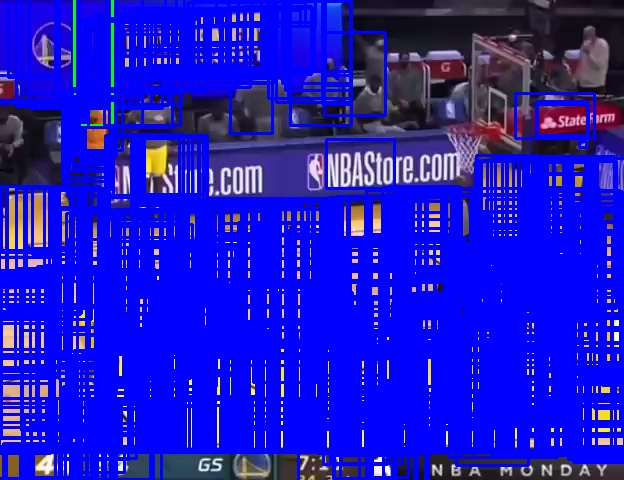

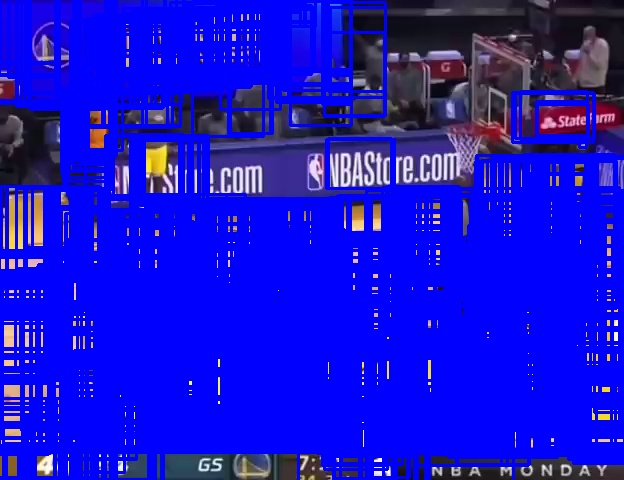

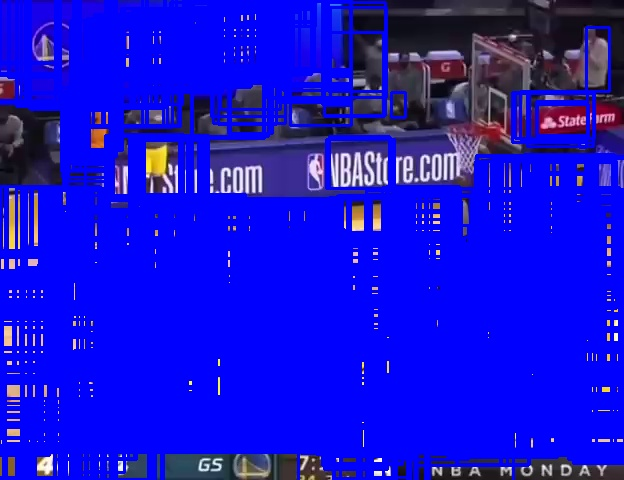

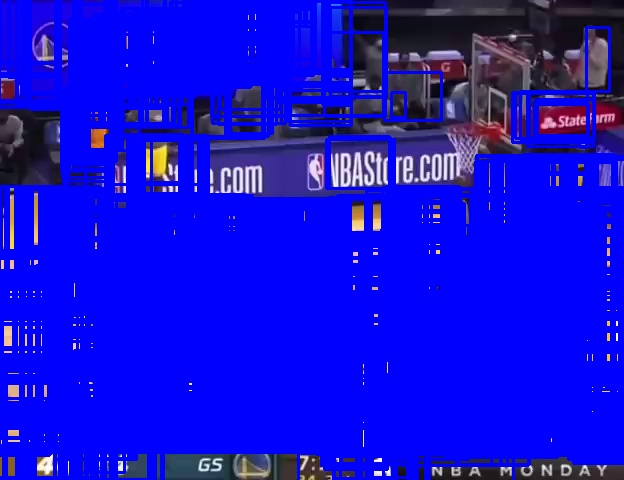

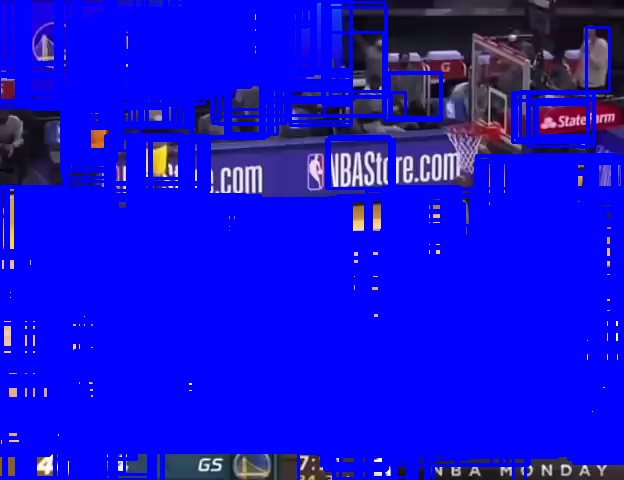

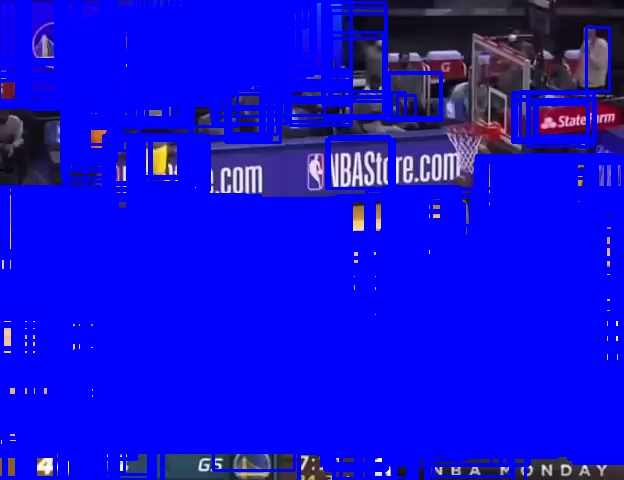

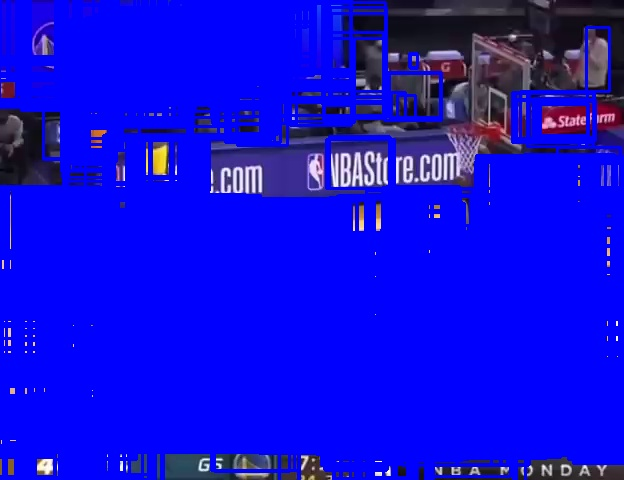

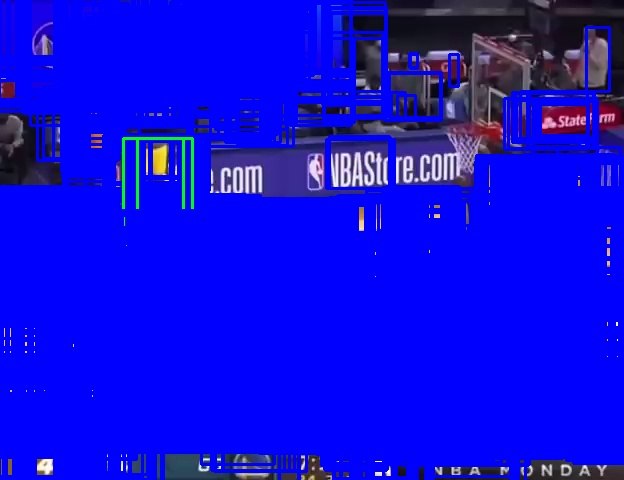

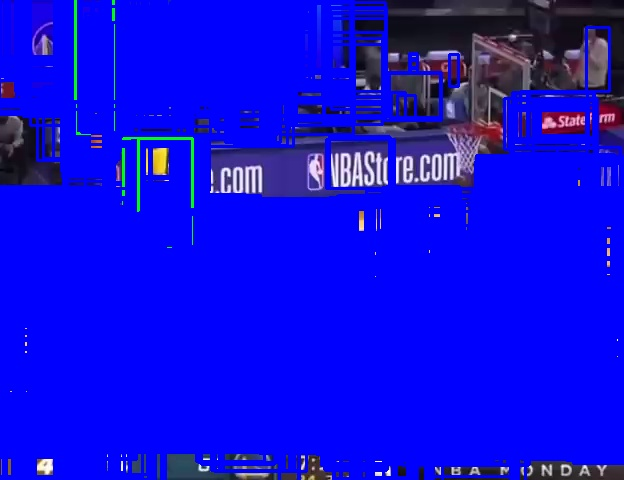

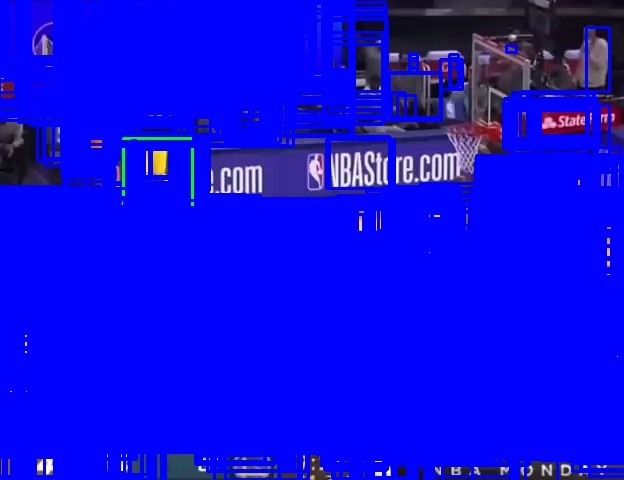

In [26]:
#@title Visualize Results
from google.colab.patches import cv2_imshow

CONF_THRESH = 0.9
names = ['ball', 'hoop', 'na']

video = cv2.VideoCapture('basketballshot.mp4')
ret, frame = video.read()

height, width, _ = frame.shape

colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255)
]

for i in range(1, 100, 10):
    bboxes = inf_results[i][0][:4].transpose()
    classes = inf_results[i][0][4:].transpose()

    for i, (bbox, cls) in enumerate(zip(bboxes, classes)):
        if max(cls) > CONF_THRESH:
            chosen = np.argmax(cls)
            # print('found', names[chosen], 'at', bbox[:2])
            x1 = bbox[0] - (0.5 * bbox[2])
            y1 = bbox[1] - (0.5 * bbox[3])
            x2 = bbox[0] + (0.5 * bbox[2])
            y2 = bbox[1] + (0.5 * bbox[3])

            x1 = int(x1 * width)
            y1 = int(y1 * height)
            x2 = int(x2 * width)
            y2 = int(y2 * height)

            cv2.rectangle(
                frame,
                (x1, y1),
                (x2, y2),
                color=colors[chosen],
                thickness=2
            )
            cv2.imwrite('output.jpg', frame)

    result_frame = cv2.imread('output.jpg')
    cv2_imshow(result_frame)